In [1]:
import keras
from keras.datasets import fashion_mnist 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import plotly as py
import plotly.graph_objs as go
import plotly.express as px
import urllib.request
from PIL import Image

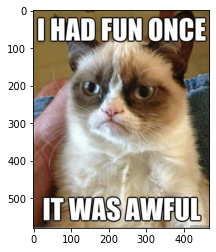

In [2]:
urllib.request.urlretrieve(
'https://medieogkommunikationsleksikon.dk/wp-content/uploads/2021/03/Grumpy-cat.jpg',
"cat.jpg")

cat = Image.open("cat.jpg")
plt.imshow(cat)

In [3]:
print(cat)

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=469x579 at 0x7FF7966B0FD0>


In [4]:
cat_array = np.array(cat)

In [5]:
cat_array.shape

(579, 469, 3)

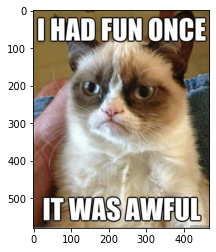

In [6]:
plt.imshow(cat_array)

In [7]:
gray_cat = Image.open('cat.jpg').convert('L')

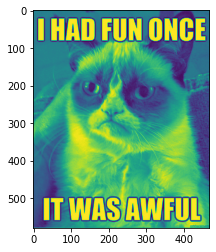

In [8]:
plt.imshow(gray_cat)

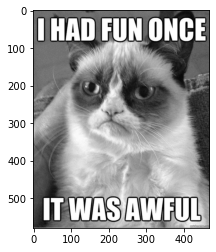

In [9]:
plt.imshow(gray_cat, cmap='gray')

In [10]:
(X_train,y_train), (X_test,y_test) = fashion_mnist.load_data()

4422102/4422102 [==============================] - 0s 0us/step


In [11]:
X_train.shape

(60000, 28, 28)

In [12]:
sample = 3
image = X_train[sample]

In [13]:
print(image)

[[  0   0   0   0   0   0   0   0  33  96 175 156  64  14  54 137 204 194
  102   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0  73 186 177 183 175 188 232 255 223 219 194 179
  186 213 146   0   0   0   0   0   0   0]
 [  0   0   0   0   0  35 163 140 150 152 150 146 175 175 173 171 156 152
  148 129 156 140   0   0   0   0   0   0]
 [  0   0   0   0   0 150 142 140 152 160 156 146 142 127 135 133 140 140
  137 133 125 169  75   0   0   0   0   0]
 [  0   0   0   0   0  54 167 146 129 142 137 137 131 148 148 133 131 131
  131 125 140 140   0   0   0   0   0   0]
 [  0   0   0   0   0   0 110 188 133 146 152 133 125 127 119 129 133 119
  140 131 150  14   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0 221 158 137 135 123 110 110 114 108 112 117
  127 142  77   0   0   0   0   0   0   0]
 [  0   0   0   0   0   4   0  25 158 137 125 119 119 110 117 117 110 119
  127 144   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0 123 156 129 112 110 102 112 10

In [14]:
image.shape

(28, 28)

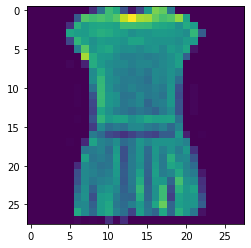

In [15]:
plt.imshow(image)

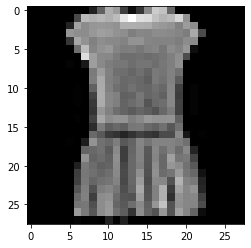

In [16]:
plt.imshow(image, cmap="gray")

In [17]:
X = X_train.reshape(-1,X_train.shape[1]*X_train.shape[2])
X.shape

(60000, 784)

In [18]:
y = y_train

In [19]:
print ("Shape for X er " + str(X.shape))
print ("Shape for y er " + str(y.shape))

Shape for X er (60000, 784)
Shape for y er (60000,)


**INDEX for datasettet**

* 0 er T-shirt
* 1 er bukser
* 2 is bluse
* 3 is kjole
* 4 is jakke
* 5 is sandal
* 6 is skjorte
* 7 is sneaker
* 8 is taske
* 9 is ankelstøvle

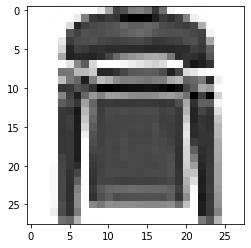

2

In [20]:
n= 5
plt.imshow(X[n].reshape(X_train.shape[1], X_train.shape[2]), cmap = plt.cm.binary)
plt.show()
y[n]

# PCA (Principle Component Analysis)

In [21]:
Clus_dataSet = StandardScaler().fit_transform(X)

In [22]:
from sklearn.decomposition import PCA
variance = 0.98
pca = PCA(variance)

In [23]:
pca.fit(Clus_dataSet)

PCA(n_components=0.98)

In [24]:
print("Antal components før PCA  = " + str(X.shape[1]))
print("Antal components efter PCA 0.98 = " + str(pca.n_components_))

Antal components før PCA  = 784
Antal components efter PCA 0.98 = 420


In [25]:
Clus_dataSet = pca.transform(Clus_dataSet)

In [26]:
print("Dimensionerne for vores data efter PCA  = " + str(Clus_dataSet.shape)) 

Dimensionerne for vores data efter PCA  = (60000, 420)


In [27]:
approximation = pca.inverse_transform(Clus_dataSet)
print("Dimension of our data after inverse transforming the PCA  = " + str(approximation.shape))

Dimension of our data after inverse transforming the PCA  = (60000, 784)


3


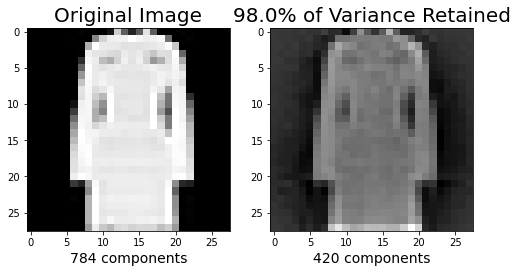

In [28]:
plt.figure(figsize=(8,4));

n = 500

# Det originale billede
plt.subplot(1, 2, 1);
plt.imshow(X[n].reshape(X_train.shape[1], X_train.shape[2]),
              cmap = plt.cm.gray,);
plt.xlabel(str(X.shape[1])+' components', fontsize = 14)
plt.title('Original Image', fontsize = 20);

# 196 principal components
plt.subplot(1, 2, 2);
plt.imshow(approximation[n].reshape(X_train.shape[1], X_train.shape[2]),
              cmap = plt.cm.gray,);
plt.xlabel(str(Clus_dataSet.shape[1]) +' components', fontsize = 14)
plt.title(str(variance * 100) + '% of Variance Retained', fontsize = 20);

print(y_train[n])

In [29]:
k_means = KMeans(init = "k-means++", n_clusters = 10, n_init = 35)

In [30]:
k_means.fit(Clus_dataSet)

KMeans(n_clusters=10, n_init=35)

In [31]:
k_means_labels = k_means.labels_
print("Listen af labels for vores klynger er " + str(np.unique(k_means_labels)))

Listen af labels for vores klynger er [0 1 2 3 4 5 6 7 8 9]


In [32]:
G = len(np.unique(k_means_labels))

cluster_index= [[] for i in range(G)]
for i, label in enumerate(k_means_labels,0):
    for n in range(G):
        if label == n:
            cluster_index[n].append(i)
        else:
            continue        

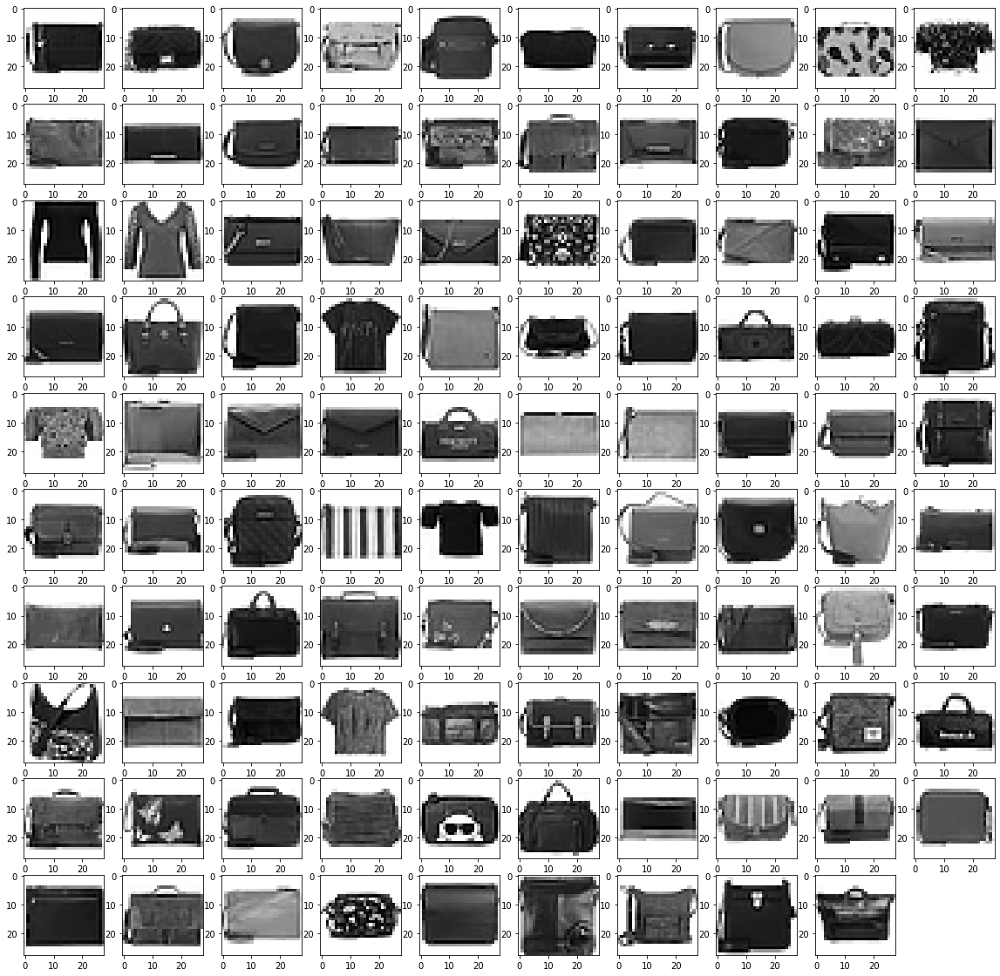

In [33]:

plt.figure(figsize=(20,20));
clust = 9
num = 100
for i in range(1,num): 
    plt.subplot(10, 10, i);
    plt.imshow(X[cluster_index[clust][i+500]].reshape(X_train.shape[1], X_train.shape[2]), cmap = plt.cm.binary);
    
plt.show()

In [34]:
Y_clust = [[] for i in range(G)]
for n in range(G):
    Y_clust[n] = y[cluster_index[n]]
    assert(len(Y_clust[n]) == len(cluster_index[n]))


In [35]:
def counter(cluster):
    unique, counts = np.unique(cluster, return_counts=True)
    label_index = dict(zip(unique, counts))
    return label_index

In [36]:
label_count= [[] for i in range(G)]
for n in range(G):
    label_count[n] = counter(Y_clust[n])

label_count[1]

{0: 521,
 1: 150,
 2: 493,
 3: 492,
 4: 253,
 5: 3911,
 6: 754,
 7: 572,
 8: 394,
 9: 162}

In [37]:
class_names = {0:'T-shirt/top', 1:'Bukser',2: 'Trøje',3: 'Kjole',4: 'Jakke',5:
               'Sandal',6: 'Skjorte', 7:'Sneaker',8:  'Taske',9: 'Ankelstøvle'}

def plotter(label_dict):
    plt.bar(range(len(label_dict)), list(label_dict.values()), align='center')
    a = []
    for i in [*label_dict]: a.append(class_names[i])
    plt.xticks(range(len(label_dict)), list(a), rotation=45, rotation_mode='anchor')

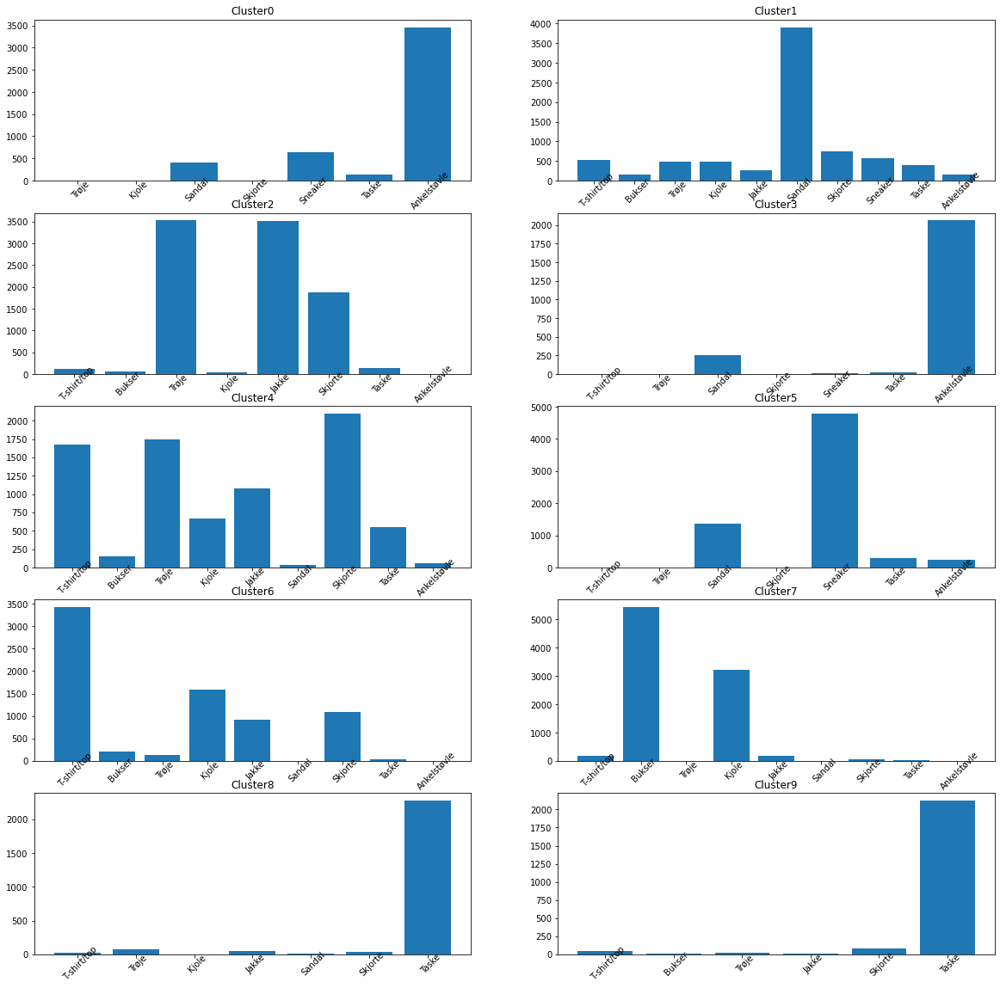

In [38]:
plt.figure(figsize=(20,20))
for i in range (1,11):
    plt.subplot(5, 2, i)
    plotter(label_count[i-1]) 
    plt.title("Cluster" + str(i-1))

In [39]:
k_means_cluster_centers = k_means.cluster_centers_
k_means_cluster_centers.shape

(10, 420)

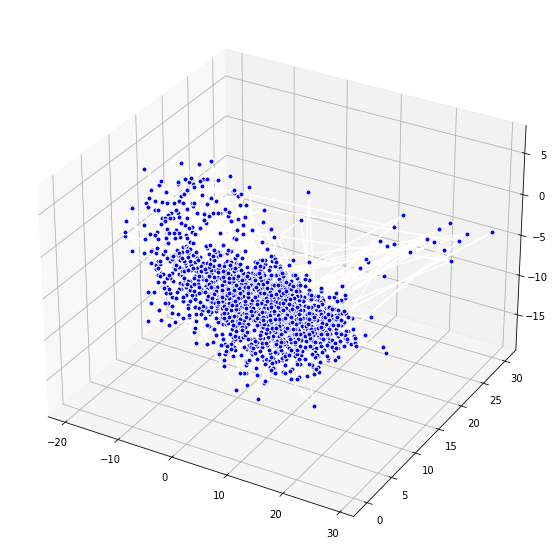

In [40]:
my_members = (k_means_labels == 3)
my_members.shape
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(1,1,1,projection='3d')
ax.plot(Clus_dataSet[my_members, 0], Clus_dataSet[my_members,1],Clus_dataSet[my_members,2], 'w', markerfacecolor="blue", marker='.',markersize=10)

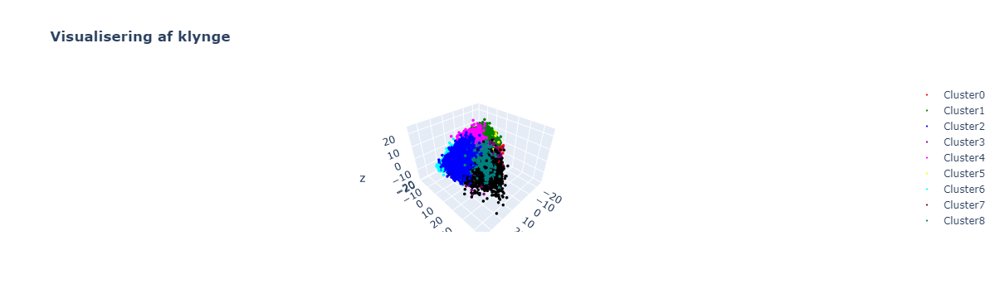

In [41]:
layout = go.Layout(
    title='<b>Visualisering af klynge</b>',
    yaxis=dict(
        title='<i>Y</i>'
    ),
    xaxis=dict(
        title='<i>X</i>'
    )
)

colors = ['red','green' ,'blue','purple','magenta','yellow','cyan','maroon','teal','black']
trace = [ go.Scatter3d() for _ in range(11)]
for i in range(0,10):
    my_members = (k_means_labels == i)
    index = [h for h, g in enumerate(my_members) if g]
    trace[i] = go.Scatter3d(
            x=Clus_dataSet[my_members, 0],
            y=Clus_dataSet[my_members, 1],
            z=Clus_dataSet[my_members, 2],
            mode='markers',
            marker = dict(size = 2,color = colors[i]),
            hovertext=index,
            name='Cluster'+str(i),
   
            )

fig = go.Figure(data=[trace[0],trace[1],trace[2],trace[3],trace[4],trace[5],trace[6],trace[7],trace[8],trace[9]], layout=layout)
    
py.offline.iplot(fig)


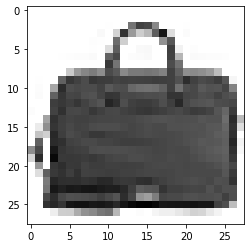

In [42]:
n = 56180
plt.imshow(X[n].reshape(28, 28), cmap = plt.cm.binary)
plt.show()
